In [78]:
from shared_notebook_utils import *
seaborn.set(style="whitegrid")
%matplotlib inline
data_datasets = load_datasets(dirnames=['mixcraft_loops_db'], clean=True)
METHOD = 'Percival14_bpm'

In [79]:
# First annotate our datasets with confidence measures
for _, dataset_name, data in data_datasets:
    methods_to_compare = ['Percival14_bpm']
    
    # Annotate all methods wirh confidence measures using the function above
    for key, item in data.items():
        for method in methods_to_compare:
            try:
                item['analysis'][method]['confidence_ffont'] = confidence_measure_audio_length(
                    item['analysis'][method]['bpm'],  
                    item['analysis']['basic_audio_properties']['length_samples'], 
                    item['analysis']['basic_audio_properties']['length_samples_effective_duration']
                )
            except KeyError:
                continue
                
            if method == 'RE13m_bpm':
                # Normalize confidence measure for RE13m_bpm so that numbers go aproximately from 0 to 1 and it is
                # comparable with our confidence measure.
                # Maximum value of conficende is 5.3 according to "Zapata, J., & Holzapfel, A. (2012). Assigning a 
                # Confidence Threshold on Automatic Beat Annotation in Large Datasets. In ISMIR (pp. 157–162)". We
                # therefore normalize so that values are comparable with conficende from other methods.
                item['analysis']['RE13m_bpm']['confidence_essentia'] = float(item['analysis']['RE13m_bpm']['confidence'])/5.3
    

133 sounds in the pool
Loop /Users/ffont/Data/AudioCommons/mixcraft_loops_db/audio/wav/10367.wav


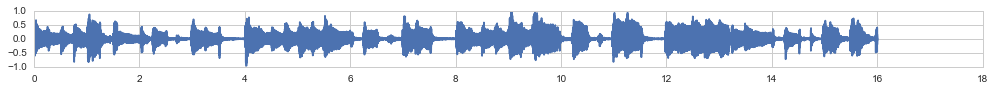

Loop /Users/ffont/Data/AudioCommons/mixcraft_loops_db/audio/wav/8826.wav


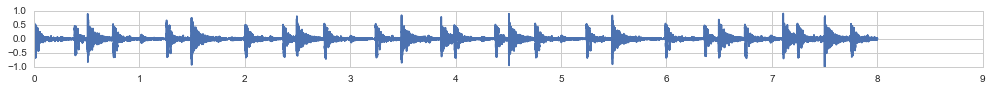

Loop /Users/ffont/Data/AudioCommons/mixcraft_loops_db/audio/wav/10542.wav


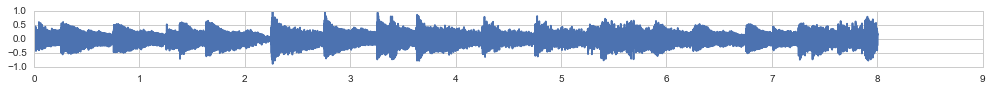

Loop /Users/ffont/Data/AudioCommons/mixcraft_loops_db/audio/wav/12085.wav


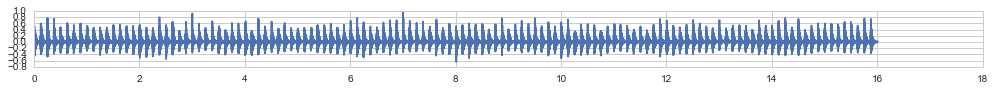

Loop /Users/ffont/Data/AudioCommons/mixcraft_loops_db/audio/wav/10135.wav


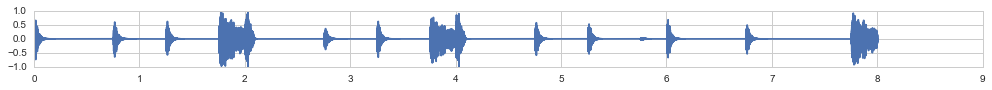

RENDERED LOOP


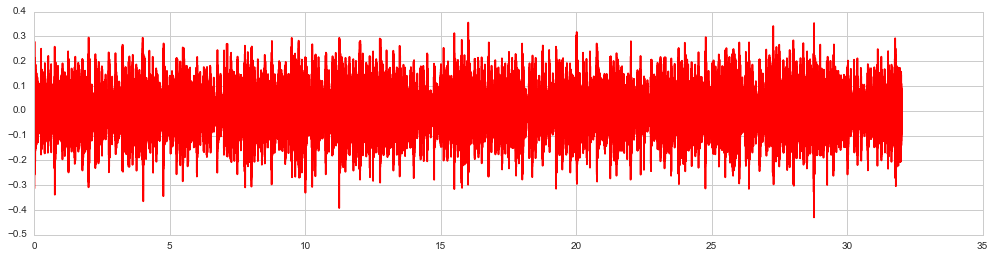

In [80]:
def condition_good_prediction(key, item, data):
    result = metric_close_bpm(data, METHOD, tolerance=0, sound_ids=[key])
    if len(result) > 0 and result[0] == 1:
        return True
    else:
        return False

for count, (dirname, dataset_name, data) in enumerate(data_datasets):
    target_BPM = 120
    N_sounds = 5  # Number of sounds to merge
    N_beats = 64  # Number of beats to generate
    min_confidence = 0.99
    sample_rate = 44100
    L = float(60 * N_beats)/target_BPM  # duration in seconds
    N = int(L * sample_rate)
    out_array = np.zeros(N)
    
    sounds_pool = filter_data(data, [('analysis.%s.%s__>=' % (METHOD, 'confidence_ffont'), min_confidence)])
    sounds_pool = filter_data(sounds_pool, [('analysis.%s.bpm__==' % METHOD, target_BPM)])
    print '%i sounds in the pool' % len(sounds_pool)
    selected_sounds = random.sample(sounds_pool.values(), N_sounds)
    for sound in selected_sounds:
        dataset_path = os.path.join(settings.DATA_PATH, dirname)
        sound_file_path = os.path.join(dataset_path, sound['wav_sound_path'])
        audio = load_audio_file(file_path=sound_file_path, sample_rate=sample_rate)
        audio = normalize2(audio)
        print 'Loop %s' % sound_file_path
        IPython.display.display(IPython.display.Audio(audio, rate=sample_rate))
        plt.figure(figsize=(17,1))
        time = np.arange(float(len(audio))) / sample_rate
        plt.plot(time, audio)
        plt.show()
        remaining_samples = N
        while remaining_samples > 0:
            currN = min(remaining_samples, len(audio))
            out_array[N - remaining_samples:N - remaining_samples + currN] +=  audio[0:currN]
            remaining_samples = remaining_samples - currN
        
    print 'RENDERED LOOP'
    out_array = out_array/N_sounds
    IPython.display.display(IPython.display.Audio(out_array, rate=sample_rate))
    plt.figure()
    plt.figure(figsize=(17,4))
    time = np.arange(float(len(out_array))) / sample_rate
    plt.plot(time, out_array, color='red')
    plt.show()
